[Comprehensive molecular portraits of human breast tumours Nature 2012](https://www.nature.com/articles/nature11412)

[Comprehensive Molecular Portraits of Invasive Lobular Breast Cancer Cell 2015](https://www.sciencedirect.com/science/article/pii/S0092867415011952?via%3Dihub)

PAM50 the most clinical relevant prediction of subtype of breast cancer

These are TPM values

In [1]:
import sys
from time import time
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import plotly.express as px
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import ParameterGrid
from sklearn.decomposition import PCA
from sklearn.manifold import MDS, TSNE
import umap

from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
import hdbscan
from sklearn import mixture

from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
# from sklearn.metrics.cluster import silhouette_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import pairwise_distances
# from sklearn.isotonic import spearmanr
# from scipy.stats import pearsonr


import gdown

from itertools import permutations

# Configuration

umap_seed = 143
seed = 42
max_jobs = -1    # If the RAM gets used up in your case, modify it to reduce RAM usage
num_comp = 2
num_clusters = 5

/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path_expression = '../data/TCGA.BRCA.expression.txt'
path_metadata = '../data/TCGA.BRCA.metadata.txt'
# path_mutation = '../data/TCGA.BRCA.mutations.txt'

df_exp = pd.read_csv(path_expression, delimiter='\t')  # \s+ handles multiple spaces
df_meta = pd.read_csv(path_metadata, delimiter='\t')
# df_mut = pd.read_csv(path_mutation, delimiter='\t')
df_meta

,patient_id,type,age_at_initial_pathologic_diagnosis,gender,race,ajcc_pathologic_tumor_stage,histological_type,histological_grade,tumor_status,vital_status,OS,OS.time,DSS,DSS.time,DFI,DFI.time,PFI,PFI.time,Redaction
0,TCGA-3C-AAAU,BRCA,55.0,FEMALE,WHITE,Stage X,Infiltrating Lobular Carcinoma,[Not Available],WITH TUMOR,Alive,0.0,4047.0,0.0,4047.0,1.0,1808.0,1.0,1808.0,NaN
1,TCGA-3C-AALI,BRCA,50.0,FEMALE,BLACK OR AFRICAN AMERICAN,Stage IIB,Infiltrating Ductal Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,4005.0,0.0,4005.0,0.0,4005.0,0.0,4005.0,NaN
2,TCGA-3C-AALJ,BRCA,62.0,FEMALE,BLACK OR AFRICAN AMERICAN,Stage IIB,Infiltrating Ductal Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,1474.0,0.0,1474.0,0.0,1474.0,0.0,1474.0,NaN
3,TCGA-3C-AALK,BRCA,52.0,FEMALE,BLACK OR AFRICAN AMERICAN,Stage IA,Infiltrating Ductal Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,1448.0,0.0,1448.0,NaN,NaN,0.0,1448.0,NaN
4,TCGA-4H-AAAK,BRCA,50.0,FEMALE,WHITE,Stage IIIA,Infiltrating Lobular Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,348.0,0.0,348.0,0.0,348.0,0.0,348.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1013,TCGA-WT-AB44,BRCA,77.0,FEMALE,WHITE,Stage IA,Infiltrating Lobular Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,883.0,0.0,883.0,0.0,883.0,0.0,883.0,NaN
1014,TCGA-XX-A899,BRCA,46.0,FEMALE,WHITE,Stage IIIA,Infiltrating Lobular Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,467.0,0.0,467.0,0.0,467.0,0.0,467.0,NaN
1015,TCGA-XX-A89A,BRCA,68.0,FEMALE,WHITE,Stage IIB,Infiltrating Lobular Carcinoma,[Not Available],TUMOR FREE,Alive,0.0,488.0,0.0,488.0,0.0,488.0,0.0,488.0,NaN
1016,TCGA-Z7-A8R5,BRCA,61.0,FEMALE,WHITE,Stage IIIA,Infiltrating Lobular Carcinoma,[Not Available],WITH TUMOR,Alive,0.0,3287.0,0.0,3287.0,NaN,NaN,1.0,181.0,NaN


## 522 patients with PAM50 annotations from Nature 2012

In [3]:
# Load labels
# gdown.download('https://drive.google.com/uc?id=1iuSZx5-j8XaWLBKz08VAWw2EHdqEL5GM', 'tcga_pam50.tsv')
# data_raw = pd.read_csv('./tcga_pam50.tsv', sep='\t', skiprows=1)
# Filter out samples with missing labels
data_raw = pd.read_excel(
    '../data/Supplementary Tables 1-4.xls',
    sheet_name=0,
    header=1,
)
data_raw["PAM50 mRNA"].value_counts()

PAM50 mRNA
Luminal A        231
Luminal B        127
Basal-like        98
HER2-enriched     58
Normal-like        8
Name: count, dtype: int64

## 514 patients from 4 major PAM50 subtypes

In [4]:
valid_labels = ["Basal-like", "HER2-enriched", "Luminal A", "Luminal B"] # "Normal-like" dropped because only 8 out of 522 (1.53%) patients
data = data_raw[data_raw['PAM50 mRNA'].isin(valid_labels)]
data

,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,PAM50 mRNA,SigClust Unsupervised mRNA,SigClust Intrinsic mRNA,miRNA Clusters,methylation Clusters,RPPA Clusters,CN Clusters,Integrated Clusters (with PAM50),Integrated Clusters (no exp),Integrated Clusters (unsup exp)
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,Basal-like,0.0,-13.0,3.0,5.0,Basal,3.0,2.0,2.0,2.0
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,Basal-like,0.0,-13.0,5.0,5.0,Basal,1.0,2.0,2.0,2.0
2,TCGA-A1-A0SK,FEMALE,54.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,Basal-like,-6.0,-13.0,5.0,5.0,Basal,1.0,2.0,2.0,2.0
3,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,Basal-like,-12.0,-13.0,4.0,4.0,Basal,4.0,2.0,1.0,1.0
4,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,Basal-like,0.0,-13.0,5.0,5.0,NaN,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
509,TCGA-E2-A15K,FEMALE,58.0,Positive,Positive,Negative,T2,T_Other,N1,Positive,...,Luminal B,-3.0,-12.0,4.0,2.0,LumA,2.0,4.0,3.0,3.0
510,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Luminal B,-3.0,-12.0,NaN,2.0,ReacI,2.0,NaN,NaN,NaN
511,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Luminal B,-4.0,-4.0,6.0,1.0,ReacI,3.0,3.0,3.0,4.0
512,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,Luminal B,-3.0,-10.0,6.0,4.0,LumA/B,NaN,NaN,NaN,NaN


## 12 of these 514 patients in Nature 2012 are not in current GDC version of this cohort
Complete TCGA IDs not matched in df_meta:
['TCGA-B6-A0I6' 'TCGA-AO-A0JL' 'TCGA-A8-A07R' 'TCGA-A2-A0CY'
 'TCGA-BH-A1ES' 'TCGA-E2-A10E' 'TCGA-E2-A106' 'TCGA-AO-A12C'
 'TCGA-AQ-A04L' 'TCGA-A8-A08C' 'TCGA-A8-A07S' 'TCGA-E2-A14S']

In [5]:
# # Perform the merge with an indicator column
# data = data.merge(
#     df_meta,
#     left_on='Complete TCGA ID',
#     right_on='patient_id',
#     how='left',
#     indicator=True
# )

# # Extract the IDs from the left that had no match in df_meta
# unmatched_ids = data.loc[data['_merge'] == 'left_only', 'Complete TCGA ID'].unique()

# print("Complete TCGA IDs not matched in df_meta:")
# print(unmatched_ids)

data = data.merge(
    df_meta,
    left_on='Complete TCGA ID',
    right_on='patient_id',
    how='inner')
data


,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,vital_status,OS,OS.time,DSS,DSS.time,DFI,DFI.time,PFI,PFI.time,Redaction
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,Dead,1.0,255.0,1.0,255.0,NaN,NaN,1.0,255.0,NaN
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,Dead,1.0,548.0,1.0,548.0,NaN,NaN,1.0,102.0,NaN
2,TCGA-A1-A0SK,FEMALE,54.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,Dead,1.0,967.0,1.0,967.0,NaN,NaN,1.0,967.0,NaN
3,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,Dead,1.0,754.0,1.0,754.0,1.0,382.0,1.0,382.0,NaN
4,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,Dead,1.0,524.0,1.0,524.0,1.0,268.0,1.0,268.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,TCGA-E2-A15K,FEMALE,58.0,Positive,Positive,Negative,T2,T_Other,N1,Positive,...,Alive,0.0,275.0,0.0,275.0,0.0,275.0,0.0,275.0,NaN
498,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Alive,0.0,626.0,0.0,626.0,0.0,626.0,0.0,626.0,NaN
499,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Dead,1.0,336.0,0.0,336.0,0.0,336.0,0.0,336.0,NaN
500,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,Alive,0.0,428.0,0.0,428.0,0.0,428.0,0.0,428.0,NaN


In [6]:
data["Complete TCGA ID"].nunique(), data["patient_id"].nunique()

(502, 502)

In [7]:
data["PAM50 mRNA"].value_counts()

PAM50 mRNA
Luminal A        225
Luminal B        125
Basal-like        95
HER2-enriched     57
Name: count, dtype: int64

## Top 2 most clearly defined histological types will be used for embedding

In [8]:
data["histological_type"].value_counts()

histological_type
Infiltrating Ductal Carcinoma       427
Infiltrating Lobular Carcinoma       42
Other, specify                       19
Mixed Histology (please specify)     10
Mucinous Carcinoma                    2
Medullary Carcinoma                   1
[Not Available]                       1
Name: count, dtype: int64

## 469 patients

In [9]:
data = data[data["histological_type"].isin(["Infiltrating Ductal Carcinoma", "Infiltrating Lobular Carcinoma"])]
data

,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,vital_status,OS,OS.time,DSS,DSS.time,DFI,DFI.time,PFI,PFI.time,Redaction
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,Dead,1.0,255.0,1.0,255.0,NaN,NaN,1.0,255.0,NaN
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,Dead,1.0,548.0,1.0,548.0,NaN,NaN,1.0,102.0,NaN
3,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,Dead,1.0,754.0,1.0,754.0,1.0,382.0,1.0,382.0,NaN
4,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,Dead,1.0,524.0,1.0,524.0,1.0,268.0,1.0,268.0,NaN
6,TCGA-BH-A1F0,FEMALE,80.0,Negative,Indeterminate,Negative,T1,T1,N1,Positive,...,Dead,1.0,785.0,1.0,785.0,NaN,NaN,1.0,785.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,TCGA-E2-A15K,FEMALE,58.0,Positive,Positive,Negative,T2,T_Other,N1,Positive,...,Alive,0.0,275.0,0.0,275.0,0.0,275.0,0.0,275.0,NaN
498,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Alive,0.0,626.0,0.0,626.0,0.0,626.0,0.0,626.0,NaN
499,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,Dead,1.0,336.0,0.0,336.0,0.0,336.0,0.0,336.0,NaN
500,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,Alive,0.0,428.0,0.0,428.0,0.0,428.0,0.0,428.0,NaN


In [10]:
data["Complete TCGA ID"].nunique(), data["patient_id"].nunique()

(469, 469)

In [11]:
#load data
df_exp = pd.read_csv(path_expression, delimiter='\t')  # \s+ handles multiple spaces
df_exp

,patient_id,sample_id,?|100130426,?|100133144,?|100134869,?|10357,?|10431,?|136542,?|155060,?|26823,...,ZWILCH|55055,ZWINT|11130,ZXDA|7789,ZXDB|158586,ZXDC|79364,ZYG11A|440590,ZYG11B|79699,ZYX|7791,ZZEF1|23140,ZZZ3|26009
0,TCGA-3C-AAAU,TCGA-3C-AAAU-01A-11R-A41B-07,0.0000,16.3644,12.9316,52.1503,408.076,0.0,1187.010,0.0000,...,415.824,931.957,129.5920,1007.780,1658.500,258.4940,1208.370,3507.25,1894.930,1180.460
1,TCGA-3C-AALI,TCGA-3C-AALI-01A-11R-A41B-07,0.0000,9.2659,17.3790,69.7553,563.893,0.0,516.041,1.0875,...,1161.330,965.198,59.8151,448.613,1343.120,198.4770,603.589,5504.62,1318.650,406.743
2,TCGA-3C-AALJ,TCGA-3C-AALJ-01A-31R-A41B-07,0.9066,11.6228,9.2294,154.2970,1360.830,0.0,592.022,0.0000,...,305.422,2531.280,35.3581,533.998,768.812,331.8220,532.185,5458.75,942.883,509.519
3,TCGA-3C-AALK,TCGA-3C-AALK-01A-11R-A41B-07,0.0000,12.0894,11.0799,143.8640,865.536,0.0,552.751,0.4137,...,394.506,668.597,55.0269,437.733,863.881,175.4240,607.365,5691.35,781.134,700.869
4,TCGA-4H-AAAK,TCGA-4H-AAAK-01A-12R-A41B-07,0.0000,6.8468,14.4298,84.2128,766.383,0.0,260.851,0.4255,...,405.711,674.468,48.9362,424.255,1049.790,14.0426,775.745,4041.70,831.915,881.702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1127,TCGA-WT-AB44,TCGA-WT-AB44-01A-11R-A41B-07,0.0000,0.0000,3.2580,42.2643,1877.420,0.0,704.541,4.0725,...,150.014,180.819,24.4349,243.535,772.959,98.5543,315.211,10937.10,800.652,443.087
1128,TCGA-XX-A899,TCGA-XX-A899-01A-11R-A36F-07,0.0000,14.3858,21.4409,137.7760,652.756,0.0,427.165,2.7559,...,456.047,457.087,70.8661,643.701,1266.540,21.2598,688.189,5118.11,1933.860,670.079
1129,TCGA-XX-A89A,TCGA-XX-A89A-01A-11R-A36F-07,0.0000,22.3240,27.2744,64.1427,722.721,0.0,376.476,0.4724,...,530.198,694.379,48.6538,341.521,1375.530,164.3840,746.812,5477.56,1437.410,953.708
1130,TCGA-Z7-A8R5,TCGA-Z7-A8R5-01A-42R-A41B-07,0.0000,2.2638,7.2933,85.0461,1140.280,0.0,252.068,0.5973,...,173.109,258.639,32.2552,248.484,796.225,51.9667,505.928,6675.63,754.413,750.829


In [12]:
# Keep only expression samples whose TCGA IDs match those in the filtered excel data.
common_ids = set(data["Complete TCGA ID"])
df_exp = df_exp[df_exp["patient_id"].isin(common_ids)]
df_exp

,patient_id,sample_id,?|100130426,?|100133144,?|100134869,?|10357,?|10431,?|136542,?|155060,?|26823,...,ZWILCH|55055,ZWINT|11130,ZXDA|7789,ZXDB|158586,ZXDC|79364,ZYG11A|440590,ZYG11B|79699,ZYX|7791,ZZEF1|23140,ZZZ3|26009
9,TCGA-A1-A0SD,TCGA-A1-A0SD-01A-11R-A115-07,0.0,9.5178,11.3241,60.2630,977.918,0.0,83.6986,0.3308,...,372.4460,648.7470,96.2700,578.281,1225.710,33.0825,868.084,3559.67,1278.970,1195.600
13,TCGA-A1-A0SH,TCGA-A1-A0SH-01A-11R-A084-07,0.0,1.6902,3.0048,79.8003,989.197,0.0,95.7054,0.0000,...,402.1980,346.3450,87.7601,581.095,801.398,19.8634,1353.240,5464.96,1312.790,1001.120
15,TCGA-A1-A0SJ,TCGA-A1-A0SJ-01A-11R-A084-07,0.0,1.6424,4.9419,134.8730,765.981,0.0,63.6488,0.3658,...,354.8240,420.6680,83.7677,2731.410,834.385,51.2117,1092.640,3032.10,958.390,718.793
17,TCGA-A1-A0SM,TCGA-A1-A0SM-01A-11R-A084-07,0.0,6.5562,7.6484,119.4760,831.124,0.0,80.8081,0.3157,...,499.8550,505.0500,60.6061,546.086,1014.200,39.4571,1410.040,4570.08,1182.450,1454.860
19,TCGA-A1-A0SO,TCGA-A1-A0SO-01A-22R-A084-07,0.0,12.5687,21.4958,383.9290,669.936,0.0,143.0170,1.0814,...,1141.2800,1001.1200,71.6436,561.254,374.169,108.4120,1791.900,1341.22,821.063,897.844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,TCGA-E2-A1B5,TCGA-E2-A1B5-01A-21R-A12P-07,0.0,2.2834,1.5578,95.6039,1267.180,0.0,74.2638,0.0000,...,351.8180,367.9040,42.2535,397.354,830.132,168.5870,822.450,2863.00,892.019,869.825
887,TCGA-E2-A1B6,TCGA-E2-A1B6-01A-31R-A12P-07,0.0,9.4801,13.2776,138.3310,1974.340,0.0,235.6090,0.2231,...,611.0870,1178.4900,16.5105,253.905,1061.800,194.1100,742.526,3321.95,867.916,780.009
888,TCGA-E2-A1BC,TCGA-E2-A1BC-01A-11R-A12P-07,0.0,6.2212,7.3031,66.2609,1034.210,0.0,96.2609,0.7955,...,337.8520,247.4150,103.4210,1278.440,1179.000,93.8743,1464.600,1774.86,1125.700,1349.240
889,TCGA-E2-A1BC,TCGA-E2-A1BC-11A-32R-A12P-07,0.0,1.8406,1.7264,74.1145,647.762,0.0,163.3670,0.7134,...,61.8869,35.6697,63.4921,363.118,1250.580,7.8473,1737.830,1889.78,1510.970,715.534


In [13]:
df_exp["patient_id"].nunique(), df_exp["sample_id"].nunique()

(469, 533)

## Merge meta data to expression in order to obtain labels for the expression

In [14]:
# df_exp = df_exp.drop_duplicates(subset="patient_id", keep="first")

merged_df = pd.merge(data, df_exp, left_on="Complete TCGA ID", right_on="patient_id", how="inner")
merged_df

,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,ZWILCH|55055,ZWINT|11130,ZXDA|7789,ZXDB|158586,ZXDC|79364,ZYG11A|440590,ZYG11B|79699,ZYX|7791,ZZEF1|23140,ZZZ3|26009
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,400.704,655.3720,58.8498,327.240,1315.200,256.3530,999.554,5042.800,619.260,854.213
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,388.833,1194.5000,14.5228,178.942,887.967,214.2120,722.510,4314.830,686.722,686.722
2,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,933.795,1174.1100,51.2288,356.755,1058.270,283.8350,662.744,4168.920,1016.270,1149.650
3,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,699.365,1240.4800,48.4429,510.134,1156.200,195.2550,1891.990,3065.000,1109.990,1364.560
4,TCGA-BH-A1F0,FEMALE,80.0,Negative,Indeterminate,Negative,T1,T1,N1,Positive,...,630.476,584.1490,92.9132,631.896,907.194,149.6940,1560.810,3440.370,1358.000,1105.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,495.574,1285.5900,60.9299,958.928,1054.630,12.4412,965.627,3609.860,1164.050,949.039
529,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,619.783,868.6060,82.0957,599.422,887.789,83.5396,1204.410,1850.660,1219.270,1399.340
530,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,215.151,58.3975,85.0672,629.498,1100.820,43.2234,1248.880,6407.630,1431.430,830.440
531,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,633.076,2694.1800,108.1240,1077.500,2069.590,210.4960,1193.390,874.191,1525.230,7269.590


In [15]:
merged_df.columns[:70]

Index(['Complete TCGA ID', 'Gender', 'Age at Initial Pathologic Diagnosis',
       'ER Status', 'PR Status', 'HER2 Final Status', 'Tumor',
       'Tumor--T1 Coded', 'Node', 'Node-Coded', 'Metastasis',
       'Metastasis-Coded', 'AJCC Stage', 'Converted Stage',
       'Survival Data Form', 'Vital Status', 'Days to Date of Last Contact',
       'Days to date of Death', 'OS event', 'OS Time', 'PAM50 mRNA',
       'SigClust Unsupervised mRNA', 'SigClust Intrinsic mRNA',
       'miRNA Clusters', 'methylation Clusters', 'RPPA Clusters',
       'CN Clusters', 'Integrated Clusters (with PAM50)',
       'Integrated Clusters (no exp)', 'Integrated Clusters (unsup exp)',
       'patient_id_x', 'type', 'age_at_initial_pathologic_diagnosis', 'gender',
       'race', 'ajcc_pathologic_tumor_stage', 'histological_type',
       'histological_grade', 'tumor_status', 'vital_status', 'OS', 'OS.time',
       'DSS', 'DSS.time', 'DFI', 'DFI.time', 'PFI', 'PFI.time', 'Redaction',
       'patient_id_y', 'sampl

In [16]:
merged_df["Complete TCGA ID"].nunique(), merged_df["histological_type"].nunique()

(469, 2)

In [17]:
X = merged_df
X

,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,ZWILCH|55055,ZWINT|11130,ZXDA|7789,ZXDB|158586,ZXDC|79364,ZYG11A|440590,ZYG11B|79699,ZYX|7791,ZZEF1|23140,ZZZ3|26009
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,400.704,655.3720,58.8498,327.240,1315.200,256.3530,999.554,5042.800,619.260,854.213
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,388.833,1194.5000,14.5228,178.942,887.967,214.2120,722.510,4314.830,686.722,686.722
2,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,933.795,1174.1100,51.2288,356.755,1058.270,283.8350,662.744,4168.920,1016.270,1149.650
3,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,699.365,1240.4800,48.4429,510.134,1156.200,195.2550,1891.990,3065.000,1109.990,1364.560
4,TCGA-BH-A1F0,FEMALE,80.0,Negative,Indeterminate,Negative,T1,T1,N1,Positive,...,630.476,584.1490,92.9132,631.896,907.194,149.6940,1560.810,3440.370,1358.000,1105.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,495.574,1285.5900,60.9299,958.928,1054.630,12.4412,965.627,3609.860,1164.050,949.039
529,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,619.783,868.6060,82.0957,599.422,887.789,83.5396,1204.410,1850.660,1219.270,1399.340
530,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,215.151,58.3975,85.0672,629.498,1100.820,43.2234,1248.880,6407.630,1431.430,830.440
531,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,633.076,2694.1800,108.1240,1077.500,2069.590,210.4960,1193.390,874.191,1525.230,7269.590


In [18]:
X.columns = [col.split('|')[0] for col in X.columns]
X

,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,400.704,655.3720,58.8498,327.240,1315.200,256.3530,999.554,5042.800,619.260,854.213
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,388.833,1194.5000,14.5228,178.942,887.967,214.2120,722.510,4314.830,686.722,686.722
2,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,933.795,1174.1100,51.2288,356.755,1058.270,283.8350,662.744,4168.920,1016.270,1149.650
3,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,699.365,1240.4800,48.4429,510.134,1156.200,195.2550,1891.990,3065.000,1109.990,1364.560
4,TCGA-BH-A1F0,FEMALE,80.0,Negative,Indeterminate,Negative,T1,T1,N1,Positive,...,630.476,584.1490,92.9132,631.896,907.194,149.6940,1560.810,3440.370,1358.000,1105.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,495.574,1285.5900,60.9299,958.928,1054.630,12.4412,965.627,3609.860,1164.050,949.039
529,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,619.783,868.6060,82.0957,599.422,887.789,83.5396,1204.410,1850.660,1219.270,1399.340
530,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,215.151,58.3975,85.0672,629.498,1100.820,43.2234,1248.880,6407.630,1431.430,830.440
531,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,633.076,2694.1800,108.1240,1077.500,2069.590,210.4960,1193.390,874.191,1525.230,7269.590


In [19]:
# 1) Set TCGA ID as index in X
X = X.set_index('Complete TCGA ID')

# 2) Select the PAM50 genes
pam50_genes = [
    "UBE2T", "BIRC5", "NUF2", "CDC6", "CCNB1", "TYMS", "MYBL2", "CEP55", "MELK", "NDC80",
    "RRM2", "UBE2C", "CENPF", "PTTG1", "EXO1", "ORC6L", "ANLN", "CCNE1", "CDC20", "MKI67",
    "KIF2C", "ACTR3B", "MYC", "EGFR", "KRT5", "PHGDH", "CDH3", "MIA", "KRT17", "FOXC1",
    "SFRP1", "KRT14", "ESR1", "SLC39A6", "BAG1", "MAPT", "PGR", "CXXC5", "MLPH", "BCL2",
    "MDM2", "NAT1", "FOXA1", "BLVRA", "MMP11", "GPR160", "FGFR4", "GRB7", "TMEM45B", "ERBB2"
]
common_genes = [g for g in pam50_genes if g in X.columns]
X = X[common_genes]

# 3) Filter merged_df to only those TCGA IDs present in X
merged_df_filtered_df = merged_df[merged_df['Complete TCGA ID'].isin(X.index)].copy()
merged_df_filtered_df


,Complete TCGA ID,Gender,Age at Initial Pathologic Diagnosis,ER Status,PR Status,HER2 Final Status,Tumor,Tumor--T1 Coded,Node,Node-Coded,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,TCGA-A2-A0T2,FEMALE,66.0,Negative,Negative,Negative,T3,T_Other,N3,Positive,...,400.704,655.3720,58.8498,327.240,1315.200,256.3530,999.554,5042.800,619.260,854.213
1,TCGA-A2-A04P,FEMALE,36.0,Negative,Negative,Negative,T2,T_Other,N3,Positive,...,388.833,1194.5000,14.5228,178.942,887.967,214.2120,722.510,4314.830,686.722,686.722
2,TCGA-A2-A0CM,FEMALE,40.0,Negative,Negative,Negative,T2,T_Other,N0,Negative,...,933.795,1174.1100,51.2288,356.755,1058.270,283.8350,662.744,4168.920,1016.270,1149.650
3,TCGA-AR-A1AR,FEMALE,50.0,Negative,Negative,Negative,T1,T1,N2,Positive,...,699.365,1240.4800,48.4429,510.134,1156.200,195.2550,1891.990,3065.000,1109.990,1364.560
4,TCGA-BH-A1F0,FEMALE,80.0,Negative,Indeterminate,Negative,T1,T1,N1,Positive,...,630.476,584.1490,92.9132,631.896,907.194,149.6940,1560.810,3440.370,1358.000,1105.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,TCGA-E2-A15L,FEMALE,65.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,495.574,1285.5900,60.9299,958.928,1054.630,12.4412,965.627,3609.860,1164.050,949.039
529,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,619.783,868.6060,82.0957,599.422,887.789,83.5396,1204.410,1850.660,1219.270,1399.340
530,TCGA-E2-A15M,FEMALE,66.0,Positive,Positive,Negative,T2,T_Other,N0,Negative,...,215.151,58.3975,85.0672,629.498,1100.820,43.2234,1248.880,6407.630,1431.430,830.440
531,TCGA-E2-A15S,FEMALE,34.0,Positive,Negative,Negative,T2,T_Other,N1,Positive,...,633.076,2694.1800,108.1240,1077.500,2069.590,210.4960,1193.390,874.191,1525.230,7269.590


In [20]:
merged_df_filtered_df.columns[:20]

Index(['Complete TCGA ID', 'Gender', 'Age at Initial Pathologic Diagnosis',
       'ER Status', 'PR Status', 'HER2 Final Status', 'Tumor',
       'Tumor--T1 Coded', 'Node', 'Node-Coded', 'Metastasis',
       'Metastasis-Coded', 'AJCC Stage', 'Converted Stage',
       'Survival Data Form', 'Vital Status', 'Days to Date of Last Contact',
       'Days to date of Death', 'OS event', 'OS Time'],
      dtype='object')

In [21]:
# 5) Extract PAM50 labels
y = merged_df_filtered_df["PAM50 mRNA"].values
X = X.values

In [22]:
X.shape, y.shape

((533, 50), (533,))

In [23]:
label_mapping = {subtype: idx for idx, subtype in enumerate(["Basal-like", "HER2-enriched", "Luminal A", "Luminal B", "Normal"])}
label_mapping

{'Basal-like': 0,
 'HER2-enriched': 1,
 'Luminal A': 2,
 'Luminal B': 3,
 'Normal': 4}

In [24]:
y_mapped = np.array([label_mapping[label] for label in y])
print(len(set(y_mapped)), "subtypes in primary samples with existing PAM50 labels from Nature 2012")
print(y_mapped)

4 subtypes in primary samples with existing PAM50 labels from Nature 2012
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3

In [25]:
# Apply log2 transformation with a pseudo-count of 1 to avoid log(0)
X = np.log2(X + 1)
# Apply robust normalization using RobustScaler
scaler = RobustScaler()
X = scaler.fit_transform(X)

In [26]:
def pca_reduce(data_no_label,n_comp = num_comp):
  t0 = time()
  scaler = StandardScaler()
  data_scale = scaler.fit_transform(data_no_label)
  pca = PCA(n_components = n_comp)
  embedding_pca = pca.fit_transform(data_scale)
  t1 = time()
  #print('PCA running time is: ' + str(t1-t0) + ' s' )

  return embedding_pca


def mds_reduce(data_no_label,n_comp = num_comp,m_job = max_jobs):
  t0 = time()
  distance_matrix = pairwise_distances(data_no_label, metric='cosine')
  embedding_mds = MDS(n_components=n_comp, n_jobs=m_job, dissimilarity="precomputed").fit_transform(distance_matrix)
  t1 = time()
  #print('MDS running time is: ' + str(t1-t0) + ' s' )

  return embedding_mds


def tsne_reduce(data_no_label,n_comp = num_comp, r_seed = seed, m_job = max_jobs, grad = 'bh'):
  t0 = time()
  embedding_tsne = TSNE(n_components=n_comp, perplexity=90, random_state= r_seed, negative_gradient_method=grad).fit(data_no_label)
  t1 = time()
  #print('t-SNE running time is: ' + str(t1-t0) + ' s' )

  return embedding_tsne


def umap_reduce(data_no_label,n_comp = num_comp, measure='euclidean', r_seed = umap_seed, m_job = max_jobs):
  t0 = time()
  reducer = umap.UMAP(n_components=n_comp, metric=measure, random_state=r_seed)
  embedding_umap = reducer.fit_transform(data_no_label)
  t1 = time()
  #print('UMAP running time is: ' + str(t1-t0) + ' s' )

  return embedding_umap





In [27]:
def plot_embedding(embeddings, labels, title='UMAP'):
    fig, ax = plt.subplots()
    scatter = ax.scatter(
        embeddings[:, 0],
        embeddings[:, 1],
        c=[sns.color_palette("Set2", n_colors=5)[["LumA","LumB","Basal","Her2","Normal"].index(lbl)] for lbl in labels]
    )
    ax.set_title(title)
    plt.axis('on')
    plt.show()


# Grid search

In [28]:
def evaluation(embedding, y, clustering_method, num_clusters = 5):
    if clustering_method == 'kmeans':
        cluster = KMeans(n_clusters=num_clusters, n_init=5, max_iter=100, random_state=42).fit_predict(embedding)
    elif clustering_method == 'spectral':
        cluster = SpectralClustering(n_clusters=num_clusters, affinity='nearest_neighbors', n_neighbors=5, random_state=42).fit_predict(embedding)
    elif clustering_method == 'agglomerative':
        cluster = AgglomerativeClustering(n_clusters=num_clusters).fit_predict(embedding)
    elif clustering_method == 'hdbscan':
        distance_matrix = pairwise_distances(embedding, metric='cosine')
        cluster = hdbscan.HDBSCAN(min_cluster_size=50).fit_predict(distance_matrix)
    elif clustering_method == 'gmm':
        cluster = mixture.GaussianMixture(n_components=num_clusters, max_iter=100, random_state=42).fit_predict(embedding)

    # Evaluate clustering performance
    # Adjusted Rand Index (ARI) - Good is close to 1 (-1,1)
    # Normalized Mutual Information (NMI) - Good is close to 1 (0,1)
    # Silhouette Score - Good is close to 1 (-1,1)
    # Jaccard Score - Good is close to 1 (0,1)

    # To account for the fact that clustering algorithms assign arbitrary numeric labels,
    # we try all possible mappings between the unique predicted cluster labels and the unique true labels.
    # This is done for all score metrics whose values can be sensitive to label assignments.
    unique_pred = np.unique(cluster)
    unique_true = np.unique(y)

    best_ari = -1
    best_nmi = -1
    best_jaccard = -1
    best_acc = -1

    if len(unique_pred) <= len(unique_true):
        for perm in permutations(unique_true, len(unique_pred)):
            mapping = dict(zip(unique_pred, perm))
            mapped_cluster = np.array([mapping[c] for c in cluster])
            current_ari = adjusted_rand_score(y, mapped_cluster)
            current_nmi = normalized_mutual_info_score(y, mapped_cluster)
            current_jaccard = jaccard_score(y, mapped_cluster, average='weighted')
            current_acc = np.mean(y == mapped_cluster)
            if current_ari > best_ari:
                best_ari = current_ari
            if current_nmi > best_nmi:
                best_nmi = current_nmi
            if current_jaccard > best_jaccard:
                best_jaccard = current_jaccard
            if current_acc > best_acc:
                best_acc = current_acc
        ari, nmi, jaccard, acc = best_ari, best_nmi, best_jaccard, best_acc
    else:
        ari = adjusted_rand_score(y, cluster)
        nmi = normalized_mutual_info_score(y, cluster)
        jaccard = jaccard_score(y, cluster, average='weighted')
        acc = np.mean(y == cluster)

    # silhouette = silhouette_score(embedding, cluster)
    # average_score = np.mean([ari, nmi, silhouette, jaccard, acc])
    average_score = np.mean([ari, nmi, jaccard, acc])


    # silhouette score is computed directly based on the embedding and cluster assignment
    # silhouette = silhouette_score(embedding, cluster)

    # norm_ari = (ari + 1) / 2
    # norm_silhouette = (silhouette + 1) / 2
    # average_score = np.mean([norm_ari, nmi, norm_silhouette, jaccard])
    # average_score = np.mean([norm_ari, nmi, jaccard])
    # return ari, nmi, silhouette, jaccard, acc, average_score
    return ari, nmi, jaccard, acc, average_score

In [29]:
def create_embeddings(n_comp = 2):
    return  {
        'PCA': pca_reduce(X, n_comp=n_comp),
        'MDS': mds_reduce(X , n_comp=n_comp ),
        't-SNE': tsne_reduce(X, n_comp=n_comp),
        'UMAP': umap_reduce(X, n_comp=n_comp)
    }


In [70]:
# --- clustering methods and grids ---
clustering_methods = ['kmeans','spectral','agglomerative','hdbscan','gmm']

pca_params = {
    'n_components': [2,3,4,5],
    'svd_solver':   ['covariance_eigh','randomized','full'],
    'tol':          [0.0,1e-4,1e-3],
}
mds_params = {
    'n_components': [2,3,4,5],
    'metric':       [True,False],
    'n_init':       [4,8,10],
    'max_iter':     [300,500,1000],
}
tsne_params = {
    'n_components':   [2,3,4,5],
    'perplexity':     [5,10,30],
    'learning_rate':  ['auto',100,500],
    'early_exaggeration':   [6,12,24],
}
umap_params = {
    'n_components': [2,3,4,5],
    'n_neighbors':  [5, 8, 10, 15, 20],
    'min_dist':     [0.001,0.01,0.1],
    'init':         ['spectral', 'pca', 'random'],
    'metric':       ['euclidean', 'canberra', 'cosine', 'correlation'],
}

# pre‐compute for speed
# scaled_X    = StandardScaler().fit_transform(X)
dist_matrix = pairwise_distances(X) # X is already robust scalled

# collect records
records = []

for method, grid, embed_fn in [
    ('PCA',  pca_params,  lambda X,p: PCA(**p).fit_transform(X)),
    ('MDS',  mds_params,  lambda X,p: MDS(**{**p,'dissimilarity':'precomputed'},
                                            n_jobs=max_jobs,random_state=seed
                                           ).fit_transform(dist_matrix)),
    ('t-SNE', tsne_params, lambda X,p: TSNE(**p, method='exact',
                                            random_state=seed
                                           ).fit_transform(X)),
    ('UMAP', umap_params, lambda X,p: umap.UMAP(**p, random_state=seed).fit_transform(X)),
]:
    print(f'Running {method}...')

    for params in ParameterGrid(grid):
        emb = embed_fn(X, params)

        for cm in clustering_methods:
            ari, nmi, jaccard, acc, avg = evaluation(emb, y_mapped, cm, num_clusters=num_clusters)
            records.append({
                'method':         method,
                'parameters':      params,
                'n_components':   params['n_components'],
                'clustering':     cm,
                'average_score':  avg
            })

Running PCA...


/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:1

Running MDS...


/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:1

Running t-SNE...


/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: Future

Running UMAP...


/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_fini

In [71]:
df = pd.DataFrame(records)
df

,method,parameters,n_components,clustering,average_score
0,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,kmeans,0.196929
1,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,spectral,0.348748
2,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,agglomerative,0.315297
3,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,hdbscan,0.409203
4,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,gmm,0.247407
...,...,...,...,...,...
4675,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,kmeans,0.254349
4676,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,spectral,0.159363
4677,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,agglomerative,0.276635
4678,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,hdbscan,0.490638


In [72]:
df.to_csv('../output/tables/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics.csv', index=False)

In [73]:
X.shape, y.shape, df.shape

((533, 50), (533,), (4680, 5))

In [30]:
df = pd.read_csv('../output/tables/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics.csv')
df

,method,parameters,n_components,clustering,average_score
0,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,kmeans,0.196929
1,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,spectral,0.348748
2,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,agglomerative,0.315297
3,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,hdbscan,0.409203
4,PCA,"{'n_components': 2, 'svd_solver': 'covariance_...",2,gmm,0.247407
...,...,...,...,...,...
4675,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,kmeans,0.254349
4676,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,spectral,0.159363
4677,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,agglomerative,0.276635
4678,UMAP,"{'init': 'random', 'metric': 'correlation', 'm...",5,hdbscan,0.490638


In [31]:
# Aggregate duplicates
df_best_parameter_of_each_method_each_clustering = (
    df
    .groupby(['method','n_components','clustering'])['average_score']
    .max()
    .reset_index()
)
df_best_parameter_of_each_method_each_clustering


,method,n_components,clustering,average_score
0,MDS,2,agglomerative,0.254933
1,MDS,2,gmm,0.286719
2,MDS,2,hdbscan,0.353993
3,MDS,2,kmeans,0.374569
4,MDS,2,spectral,0.237285
...,...,...,...,...
75,t-SNE,5,agglomerative,0.252219
76,t-SNE,5,gmm,0.302077
77,t-SNE,5,hdbscan,0.420396
78,t-SNE,5,kmeans,0.335732


/tmp/ipykernel_29620/2298232424.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


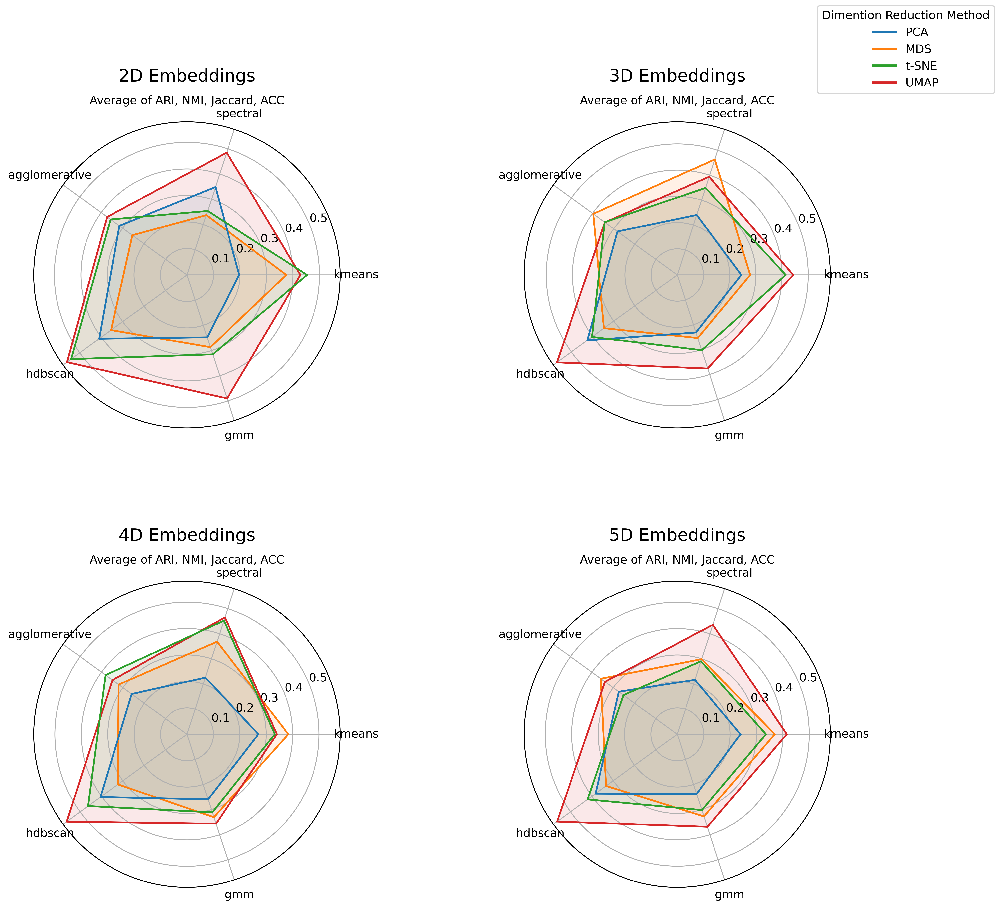

In [32]:
clustering = ['kmeans', 'spectral', 'agglomerative', 'hdbscan', 'gmm']
angles = np.linspace(0, 2*np.pi, len(clustering), endpoint=False).tolist()
angles += angles[:1]

methods = df_best_parameter_of_each_method_each_clustering['method'].unique()
n_comps = sorted(df_best_parameter_of_each_method_each_clustering['n_components'].unique())

# color mapping
color_map = {
    'PCA':    'tab:blue',
    'MDS':    'tab:orange',
    't-SNE':  'tab:green',
    'UMAP':   'tab:red'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 12), dpi=500, subplot_kw=dict(polar=True), gridspec_kw={'hspace': 0.5})
axes = axes.flatten()

for idx, comp in enumerate(n_comps):
    ax = axes[idx]
    sub = df_best_parameter_of_each_method_each_clustering[df_best_parameter_of_each_method_each_clustering['n_components']==comp]
    pivot = sub.pivot(index='method', columns='clustering', values='average_score')
    for meth in methods:
        vals = pivot.loc[meth, clustering].tolist()
        vals += vals[:1]
        c = color_map[meth]
        ax.plot(angles, vals, label=meth, color=c)
        ax.fill(angles, vals, color=c, alpha=0.1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(clustering)
    ax.set_title(f"{comp}D Embeddings", fontsize=15, pad=35)
    ax.text(0.5, 1.05, "Average of ARI, NMI, Jaccard, ACC",
            transform=ax.transAxes, fontsize=10, ha='center', va='bottom')

# custom legend
legend_elements = [
    Line2D([0], [0], color=color_map['PCA'],   lw=2, label='PCA'),
    Line2D([0], [0], color=color_map['MDS'],   lw=2, label='MDS'),
    Line2D([0], [0], color=color_map['t-SNE'], lw=2, label='t-SNE'),
    Line2D([0], [0], color=color_map['UMAP'],  lw=2, label='UMAP'),
]
fig.legend(handles=legend_elements,
           loc='upper right',
           title="Dimention Reduction Method")

plt.tight_layout()
plt.savefig("../output/figures/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics_radar_plot.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [33]:
df_best_parameter_of_each_method_each_clustering

,method,n_components,clustering,average_score
0,MDS,2,agglomerative,0.254933
1,MDS,2,gmm,0.286719
2,MDS,2,hdbscan,0.353993
3,MDS,2,kmeans,0.374569
4,MDS,2,spectral,0.237285
...,...,...,...,...
75,t-SNE,5,agglomerative,0.252219
76,t-SNE,5,gmm,0.302077
77,t-SNE,5,hdbscan,0.420396
78,t-SNE,5,kmeans,0.335732


In [34]:
# 1) Maximum average_score per method
best_scores = (
    df_best_parameter_of_each_method_each_clustering.loc[df_best_parameter_of_each_method_each_clustering['n_components'].isin([2, 3])]
    .groupby('method')['average_score']
    .max()
    .reset_index(name='max_average_score')
)
best_scores

,method,max_average_score
0,MDS,0.463894
1,PCA,0.424528
2,UMAP,0.567730
3,t-SNE,0.540234


In [35]:
# 2) Full best‐row per method
idx = (
    df_best_parameter_of_each_method_each_clustering.loc[df_best_parameter_of_each_method_each_clustering['n_components'].isin([2, 3])]
    .groupby('method')['average_score']
    .idxmax()
)
best_params_per_method = (
    df_best_parameter_of_each_method_each_clustering.loc[df_best_parameter_of_each_method_each_clustering['n_components'].isin([2, 3])]
    .loc[idx]
    .reset_index(drop=True)
)
best_params_per_method

,method,n_components,clustering,average_score
0,MDS,3,spectral,0.463894
1,PCA,3,hdbscan,0.424528
2,UMAP,3,hdbscan,0.567730
3,t-SNE,2,hdbscan,0.540234


In [36]:
# # Boolean mask where each row’s average_score equals the max for its method
# mask = df['average_score'] == df.groupby('method')['average_score'].transform('max')

# # Select those rows
# best_rows = df[mask]
# best_rows

In [37]:
# Restrict to n_components 2 or 3
df23 = df[df['n_components'].isin([2, 3])]

# Boolean mask where each row’s average_score equals the per‐method max within the 2/3 subset
mask = df23['average_score'] == df23.groupby('method')['average_score'].transform('max')

# Select those rows
best_rows = df23[mask]
best_rows

,method,parameters,n_components,clustering,average_score
48,PCA,"{'n_components': 3, 'svd_solver': 'covariance_...",3,hdbscan,0.424528
53,PCA,"{'n_components': 3, 'svd_solver': 'covariance_...",3,hdbscan,0.424528
58,PCA,"{'n_components': 3, 'svd_solver': 'covariance_...",3,hdbscan,0.424528
63,PCA,"{'n_components': 3, 'svd_solver': 'randomized'...",3,hdbscan,0.424528
68,PCA,"{'n_components': 3, 'svd_solver': 'randomized'...",3,hdbscan,0.424528
73,PCA,"{'n_components': 3, 'svd_solver': 'randomized'...",3,hdbscan,0.424528
78,PCA,"{'n_components': 3, 'svd_solver': 'full', 'tol...",3,hdbscan,0.424528
83,PCA,"{'n_components': 3, 'svd_solver': 'full', 'tol...",3,hdbscan,0.424528
88,PCA,"{'n_components': 3, 'svd_solver': 'full', 'tol...",3,hdbscan,0.424528
316,MDS,"{'max_iter': 500, 'metric': True, 'n_component...",3,spectral,0.463894


In [38]:
print(best_rows[best_rows["method"] == "UMAP"]["parameters"].iloc[0])

{'init': 'random', 'metric': 'canberra', 'min_dist': 0.1, 'n_components': 3, 'n_neighbors': 5}


# Visualize 3D using matplotlib or Plotly

/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


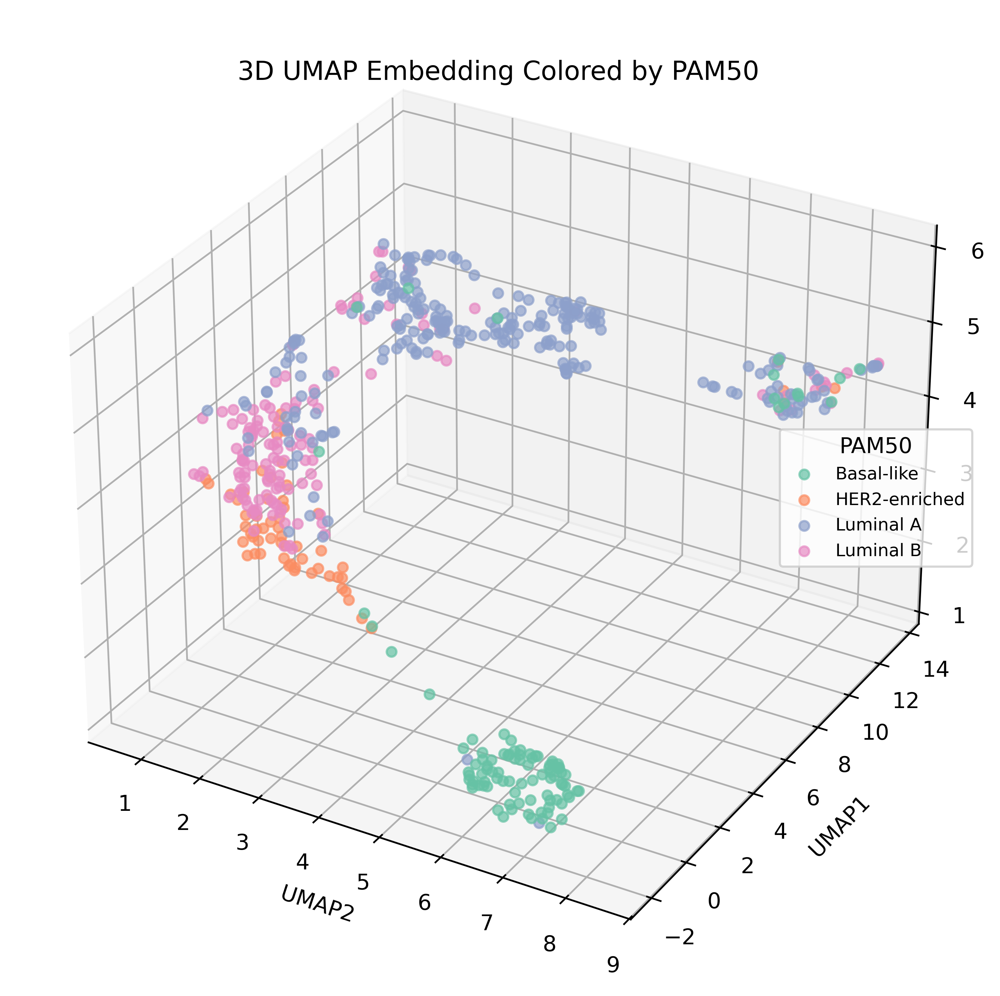

In [39]:
import ast

param_str = best_rows[best_rows["method"] == "UMAP"]["parameters"].iloc[0]
umap_params = ast.literal_eval(param_str)
embedding = umap.UMAP(**umap_params, random_state=seed).fit_transform(X)

# 2) Build DataFrame
cols = ['UMAP1','UMAP2','UMAP3']
df_emb = pd.DataFrame(embedding, columns=cols)
name_to_code = {
    'Basal-like':     0,
    'HER2-enriched':  1,
    'Luminal A':      2,
    'Luminal B':      3,
    'Normal':         4
}
code_to_name = {v: k for k, v in name_to_code.items()}
df_emb["PAM50"] = [code_to_name[c] for c in y_mapped]

# 3) 3D scatter plot
fig = plt.figure(figsize=(10, 8), dpi=500)
ax = fig.add_subplot(111, projection='3d')

unique_labels = np.unique(df_emb["PAM50"])
palette = dict(zip(unique_labels, sns.color_palette("Set2", n_colors=len(unique_labels))))

for label in unique_labels:
    idx = df_emb["PAM50"] == label
    ax.scatter(
        df_emb.loc[idx, "UMAP2"],
        df_emb.loc[idx, "UMAP1"],
        df_emb.loc[idx, "UMAP3"],
        label=label,
        color=palette[label],
        s=20,
        alpha=0.7
    )

ax.set_xlabel("UMAP2")
ax.set_ylabel("UMAP1")
ax.set_zlabel("UMAP3")
ax.set_title("3D UMAP Embedding Colored by PAM50",  y=1)
ax.legend(title="PAM50", loc="center right", fontsize=8, title_fontsize=10)
plt.show()

In [40]:
df_embedding = pd.DataFrame(embedding, columns=['Component_1', 'Component_2', 'Component_3'])

df_embedding.to_csv('../output/tables/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics_3D_UMAP_embedding.csv', index=False)

In [40]:
# import ast
# # 1) Parse best UMAP parameter string
# param_str = best_rows[best_rows["method"] == "UMAP"]["parameters"].iloc[0]
# umap_params = ast.literal_eval(param_str)

# # 2) Compute UMAP embedding
# embedding = umap.UMAP(**umap_params, random_state=seed).fit_transform(X)
# n_dim = embedding.shape[1]

# # 3) Build DataFrame
# name_to_code = {
#     'Basal-like':     0,
#     'HER2-enriched':  1,
#     'Luminal A':      2,
#     'Luminal B':      3,
#     'Normal':         4
# }

# # Invert it:
# code_to_name = {code: name for name, code in name_to_code.items()}

# cols = [f"UMAP{i+1}" for i in range(n_dim)]
# df_emb = pd.DataFrame(embedding, columns=cols)
# df_emb["PAM50"] = [code_to_name[c] for c in y_mapped]

# # 4) Plot with Plotly
# if n_dim == 2:
#     fig = px.scatter(
#         df_emb,
#         x=cols[0],
#         y=cols[1],
#         color="PAM50",
#         title="UMAP Embedding Colored by PAM50",
#         width=700,
#         height=600
#     )
# else:
#     fig = px.scatter_3d(
#         df_emb,
#         x=cols[0],
#         y=cols[1],
#         z=cols[2],
#         color="PAM50",
#         title="UMAP Embedding Colored by PAM50",
#         width=700,
#         height=600,
#     )
#     fig.update_traces(marker=dict(size=3))
#     fig.write_image("/Users/zichenjiang/Downloads/TCGA BRCA BENG 285/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics_best_2D_UMAP.pdf")
# fig.show()

# HDBSCAN clustering of the embedding

In [41]:
# 1) Run HDBSCAN on the existing embedding
# 2) Compute HDBSCAN clustering
clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
hdb_labels = clusterer.fit_predict(embedding)

# 2) Build DataFrame for Plotly
n_dim = embedding.shape[1]
cols = [f"UMAP{i+1}" for i in range(n_dim)]
df_emb = pd.DataFrame(embedding, columns=cols)
df_emb["HDBSCAN"] = (hdb_labels + 1).astype(str)

# Determine ordered categories
categories = sorted(df_emb['HDBSCAN'].unique(), key=int)

# 3) Plot dynamically in 2D or 3D with ordered legend and custom title
if n_dim == 2:
    fig = px.scatter(
        df_emb,
        x=cols[0],
        y=cols[1],
        color="HDBSCAN",
        category_orders={"HDBSCAN": categories},
        labels={"HDBSCAN": "HDBSCAN Clusters"},
        title="UMAP Embedding Colored by HDBSCAN Clusters",
        width=700,
        height=600
    )
else:
    fig = px.scatter_3d(
        df_emb,
        x=cols[0],
        y=cols[1],
        z=cols[2],
        color="HDBSCAN",
        category_orders={"HDBSCAN": categories},
        labels={"HDBSCAN": "HDBSCAN Clusters"},
        title="UMAP Embedding Colored by HDBSCAN Clusters",
        width=700,
        height=600
    )

# 4) Set marker size small
fig.update_traces(marker=dict(size=3))
fig.write_image("../output/figures/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics_best_2D_UMAP_HDBSCAN_default.pdf")
fig.show()

/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


# HDBSCAN clustering look better with a different parameter

In [42]:
# 1) Run HDBSCAN on the existing embedding
clusterer = hdbscan.HDBSCAN(min_cluster_size=50)
hdb_labels = clusterer.fit_predict(embedding)

# 2) Build DataFrame for Plotly
n_dim = embedding.shape[1]
cols = [f"UMAP{i+1}" for i in range(n_dim)]
df_emb = pd.DataFrame(embedding, columns=cols)
df_emb["HDBSCAN"] = (hdb_labels + 1).astype(str)

# Determine ordered categories
categories = sorted(df_emb['HDBSCAN'].unique(), key=int)

# 3) Plot dynamically in 2D or 3D with ordered legend and custom title
if n_dim == 2:
    fig = px.scatter(
        df_emb,
        x=cols[0],
        y=cols[1],
        color="HDBSCAN",
        category_orders={"HDBSCAN": categories},
        labels={"HDBSCAN": "HDBSCAN Clusters"},
        title="UMAP Embedding Colored by HDBSCAN Clusters",
        width=700,
        height=600
    )
else:
    fig = px.scatter_3d(
        df_emb,
        x=cols[0],
        y=cols[1],
        z=cols[2],
        color="HDBSCAN",
        category_orders={"HDBSCAN": categories},
        labels={"HDBSCAN": "HDBSCAN Clusters"},
        title="UMAP Embedding Colored by HDBSCAN Clusters",
        width=700,
        height=600
    )

# 4) Set marker size small
fig.update_traces(marker=dict(size=3))
fig.write_image("../output/figures/469_patients_533_samples_no_Normal_like_patients_and_patients_of_two_histological_subtypes_PAM50_genes_robustscaler_4_reduction_methods_parameter_search_5_clustering_methods_default_4_metrics_best_2D_UMAP_HDBSCAN_default.pdf")
fig.show()

/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/chris/miniconda3/envs/project1_env/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [44]:
df_emb

,UMAP1,UMAP2,UMAP3,HDBSCAN
0,-1.124007,7.165960,1.819048,3
1,-1.470137,7.273944,1.180035,3
2,-1.892001,6.631976,1.733495,3
3,-1.163245,6.232942,1.741800,3
4,-1.193957,7.488554,1.581825,3
...,...,...,...,...
528,1.562916,0.660291,4.381746,4
529,1.164648,2.258949,3.084835,4
530,12.919642,7.843654,3.972446,1
531,1.452938,1.263388,4.138268,4
